# **♫ Sentiment Analysis of Music Artists ♫**

In [183]:
import pandas as pd
import string
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
import seaborn
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from wordcloud import WordCloud
import nltk
import nltk.data
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk import word_tokenize
nltk.download('vader_lexicon')
nltk.download('punkt')
import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\rajro\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\rajro\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [184]:
df_ag=pd.read_csv('csv/ArianaGrande.csv')
df_by=pd.read_csv('csv/Beyonce.csv')
df_be=pd.read_csv('csv/BillieEilish.csv')
df_cb=pd.read_csv('csv/CardiB.csv')
df_cp=pd.read_csv('csv/CharliePuth.csv')
df_cpl=pd.read_csv('csv/ColdPlay.csv')
df_dr=pd.read_csv('csv/Drake.csv')
df_dl=pd.read_csv('csv/DuaLipa.csv')
df_es=pd.read_csv('csv/EdSheeran.csv')
df_em=pd.read_csv('csv/Eminem.csv')
df_jb=pd.read_csv('csv/JustinBieber.csv')
df_kp=pd.read_csv('csv/KatyPerry.csv')
df_kl=pd.read_csv('csv/Khalid.csv')
df_lg=pd.read_csv('csv/LadyGaga.csv')
df_m5=pd.read_csv('csv/Maroon5.csv')
df_nm=pd.read_csv('csv/NickiMinaj.csv')
df_pm=pd.read_csv('csv/PostMalone.csv')
df_rh=pd.read_csv('csv/Rihanna.csv')
df_sg=pd.read_csv('csv/SelenaGomez.csv')
df_ts=pd.read_csv('csv/TaylorSwift.csv')
df_all=[df_ag,df_by,df_be,df_cb, df_cp, df_cpl, df_dr, df_dl, df_es, df_em, df_jb, df_kp, df_kl, df_lg, df_m5, df_nm, df_pm, df_rh, df_sg, df_ts]

# **Cleaning**
>**Note**: To prepare the dataset for analysis, we need to eliminate any rows containing NaN values, exclude unreleased albums, and filter out songs that are sung in languages other than English. This process ensures that the data we work with is clean and relevant, allowing for more accurate insights and analyses. 
1. Lyrics to Words: This function converts all the lyrics into individual words.
2. To Word: This function processes the words to eliminate duplicates, retaining only unique words.
3. Count Words: This function counts both unique and non-unique words present in the lyrics.
4. Word Stats: This function provides statistical information about the words used.

In [185]:
def lyrics_to_words(document):
    """
    This function splits the text of lyrics to  single words, removing stopwords and doing the lemmatization to each word

    parameters:
    document: text to split to single words
    """
    stop_words = set(stopwords.words('english'))
    exclude = set(string.punctuation)
    lemma = WordNetLemmatizer()
    stopwordremoval = " ".join([i for i in document.lower().split() if i not in stop_words])
    punctuationremoval = ''.join(ch for ch in stopwordremoval if ch not in exclude)
    normalized = " ".join(lemma.lemmatize(word) for word in punctuationremoval.split())
    return normalized

In [186]:
def toword(df):
    def unique(list1):
       # intilize a null list
         unique_list = []
       # traverse for all elements
         for x in list1:
             # check if exists in unique_list or not
             if x not in unique_list:
                  unique_list.append(x)
         return unique_list
    
    #Stores unique words of each lyrics song into a new column called words
    #list used to store the words
    words = []
    #iterate trought each lyric and split unique words appending the result into the words list
    df = df.reset_index(drop=True)
    for word in df['Lyric'].tolist():
        words.append(unique(lyrics_to_words(word).split()))
    #create the new column with the information of words lists
    df['words'] = words
    return df

In [187]:
def cleaning(df):
    a=[]
    i=0
    df1=df
    title = df['Title']
    for t in df['Title']:
        r=Re=l=Li=c=m=V=ve=D=rs=0
        r=t.find('remix')
        Re=t.find('Remix')
        l=t.find('live')
        Li=t.find('Live')
        V=t.find('Version')
        ve=t.find('version')
        D=t.find('Demo ')
        D=t.find('Demo')
        rs=t.find('Reprise')
        c=t.find('COPY')
        m=t.find('Mix')
        if r != -1:
            a.append(t)
        elif Re != -1:
            a.append(t)
        elif l != -1:
            a.append(t)
        elif Li != -1:
            a.append(t)
        elif V != -1:
            a.append(t)
        elif ve != -1:
            a.append(t)
        elif D != -1:
            a.append(t)
        elif rs != -1:
            a.append(t)
        elif c != -1:
            a.append(t)
        elif m != -1:
            a.append(t)
    
    for t1 in df['Title']:
        for t2 in a:
            if t1 == t2:
                df1=df1.drop(i)
        i=i+1
    
    df1.dropna(subset = ["Title"], inplace=True)
    df1.dropna(subset = ["Lyric"], inplace=True)
    df1.drop_duplicates(subset ="Title",keep = False, inplace = True)
    df1.drop_duplicates(subset ="Lyric",keep = False, inplace = True) 
    return df1

In [188]:
def countword(df):    
    
    c=[]
    for word in df['words']:
        for w in word:
            c.append(w)
    return c

In [189]:
def words_stats(df,main_df):
    unique_words = []
    total_words = []
    total_news = []
    name = []
    
    for value in df.columns[1:]:
        unique_words.append(np.count_nonzero(df[value]))
        total_words.append(sum(df[value]))
        name.append(str(value))
        total_news.append(main_df['name'][main_df['name']==value].count())
        data = pd.DataFrame({'name':name,
                          'unique words':unique_words,
                          'total words':total_words,
                          'total songs':total_news})
    data['words per songs'] = round(data['total words'] / data['total songs'],0)
    data['words per songs'] = data['words per songs'].astype('int')
    return data

##### *After appling all the function we generate a main dataframe.*

In [190]:
df_allc=[]
for df in df_all:
    df_c=cleaning(df)
    df_w=toword(df_c)
    df_allc.append(df_w)

frames=df_allc
df_main = pd.concat(frames,ignore_index=True)
df_main= df_main.drop(df_main[(df_main.Year < 1000) | (df_main.Year > 2021)].index)
#df_main= df_main.drop(['Unnamed: 0','Unnamed: 0.1'],axis=1)
df_main=df_main.reset_index(drop=True)

# **Preparing Data for visualization**
>**Note**: Now once the data is cleaned we'll divide our main dataframe into sub parts for ease of visualization

1. The first visualization we'll look at it how many unique word vs total words these artist uses and lexicalrichness of each artist

In [191]:
before=[]
after=[]
length=[]
ulength=[]
wd=[]

for df in df_all:
    a,b=df.shape
    before.append(a)
    
for dfc in df_allc:
    a,b=dfc.shape
    after.append(a)  
    c=countword(dfc)
    l=len(c)
    ul=len(np.unique(c))
    wd.append(c)
    length.append(l)
    ulength.append(ul)

In [192]:
artists=['ArianaGrande.csv', 'Beyonce.csv', 'BillieEilish.csv', 'CardiB.csv', 'CharliePuth.csv', 'ColdPlay.csv', 'Drake.csv', 'DuaLipa.csv', 'EdSheeran.csv', 'Eminem.csv', 'JustinBieber.csv', 'KatyPerry.csv', 'Khalid.csv', 'LadyGaga.csv', 'Maroon5.csv',  'NickiMinaj.csv', 'PostMalone.csv', 'Rihanna.csv', 'SelenaGomez.csv', 'TaylorSwift.csv']
print(len(artists))
print(len(before))
print(len(after))
print(len(wd))
print(len(ulength))
print(len(length))
df_info =pd.DataFrame({'name':artists,'before':before,'after':after,'words':wd,'unique words':ulength,'word count':length})
df_info['diff']=df_info['before']-df_info['after']
df_info['words per songs'] = round(df_info['word count'] / df_info['after'],0)
df_info['words per songs'] = df_info['words per songs'].astype('int')
df_info['lexicalrichness']=(df_info['unique words']/df_info['word count'])*100
df_info=df_info[['name','before','after','diff','words','words per songs','unique words','word count','lexicalrichness']]
df_info

20
20
20
20
20
20


,name,before,after,diff,words,words per songs,unique words,word count,lexicalrichness
0,ArianaGrande.csv,308,202,106,"[thought, id, end, sean, match, wrote, song, r...",65,3396,13195,25.737022
1,Beyonce.csv,406,224,182,"[beyoncé, ive, drinkin, get, filthy, liquor, t...",85,4982,19041,26.164592
2,BillieEilish.csv,145,73,72,"[know, im, good, ive, learned, lose, cant, aff...",51,1519,3720,40.833333
3,CardiB.csv,75,69,6,"[cardi, b, al, mclaran, megan, thee, stallion,...",112,2507,7710,32.516213
4,CharliePuth.csv,75,65,10,"[woahoh, hmhmm, runnin, round, throwin, dirt, ...",61,1297,3953,32.810524
5,ColdPlay.csv,344,225,119,"[come, meet, tell, im, sorry, know, lovely, fi...",46,2693,10271,26.219453
6,Drake.csv,466,420,46,"[wishin, yeah, movin, calm, start, trouble, tr...",141,9778,59086,16.548759
7,DuaLipa.csv,247,111,136,"[one, talkin, sleep, night, makin, crazy, mind...",66,2113,7292,28.976961
8,EdSheeran.csv,296,202,94,"[club, best, place, find, lover, bar, go, frie...",92,4492,18650,24.085791
9,Eminem.csv,521,470,51,"[look, gonna, go, easy, hurt, feeling, im, goi...",223,18791,104806,17.929317


In [193]:
fig = go.Figure(data=[
    go.Bar(name='Unique Word Count', x=df_info['name'], y=df_info['unique words'].tolist()),
    go.Bar(name='Total Word Count', x=df_info['name'], y=df_info['word count'].tolist()),
    
])
# Change the bar mode
fig.update_layout(barmode='group',title={'text': "Total words vs Unique words",'y':0.9,'x':0.5,'xanchor': 'center','yanchor': 'top'})
fig.show()

In [194]:
print(df_info[df_info.lexicalrichness == max(df_info['lexicalrichness'])].loc[:,'name'])
print(max(df_info['lexicalrichness']))
fig = px.bar(df_info, x='name',y='lexicalrichness')
fig.update_layout(title={'text': "Lexicalrichness of all artist",'y':1,'x':0.5,'xanchor': 'center','yanchor': 'top'})
fig.show()

2    BillieEilish.csv
Name: name, dtype: object
40.833333333333336


Now dividing the mail data frame to visualize how many songs artist sings over a year

In [195]:
df_group=df_main.groupby(['Artist','Year']).count().iloc[:,0:2]
#df_group=df_group.drop("Unnamed: 0",axis=1)
df_group =df_group.reset_index()
df_group

,Artist,Year,Title,Album
0,Ariana Grande,2008.0,3,3
1,Ariana Grande,2009.0,2,1
2,Ariana Grande,2010.0,4,2
3,Ariana Grande,2011.0,6,1
4,Ariana Grande,2012.0,4,2
...,...,...,...,...
277,Taylor Swift,2017.0,22,19
278,Taylor Swift,2018.0,9,8
279,Taylor Swift,2019.0,30,21
280,Taylor Swift,2020.0,57,50


In [196]:
import pandas as pd
import plotly.express as px

# Assuming df_group is already defined
df_temp = df_group.drop('Artist', axis=1)
df_temp = df_temp.groupby(['Year']).count()
df_temp = df_temp.reset_index()

# Filter the DataFrame to include only years from 2001 to 2025
df_temp = df_temp[(df_temp['Year'] >= 2000) & (df_temp['Year'] <= 2025)]

fig = px.line(df_temp, x='Year', y='Title')
fig.update_layout(title={'text': "No. of Titles by all artists from 2001-2025", 'y': 0.95, 'x': 0.5, 'xanchor': 'center', 'yanchor': 'top'})
fig.show()

Now let's look at the above visualization with respect to each artist.

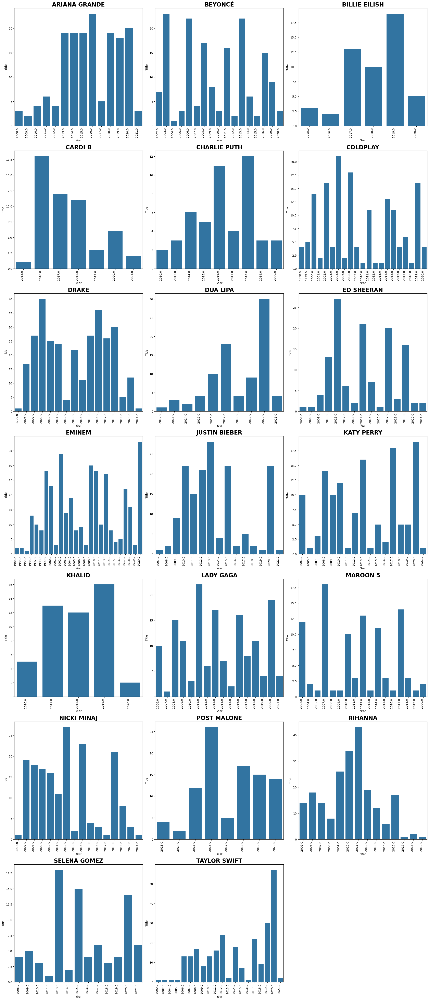

In [229]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_main and df_group are already defined
df_temp = []
artists = df_main['Artist'].unique()

# Create a list of DataFrames for each artist
for artist in artists:
    df_temp.append(df_group[df_group['Artist'] == artist])

# Define the number of rows and columns for the subplots
total_cols = 3
total_rows = 7
fig, axs = plt.subplots(nrows=total_rows, ncols=total_cols,
                        figsize=(7*total_cols, 7*total_rows), constrained_layout=True)

# Flatten the axs array for easier indexing
axs = axs.flatten()

# Plot the bar plots in a grid
for i, artist in enumerate(artists):
    sns.barplot(data=df_temp[i], x="Year", y="Title", ax=axs[i])
    axs[i].set_title(artist.upper(), fontdict={'fontweight': 'bold', 'fontsize':20})
    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=90, ha='right')

# Remove any empty subplots
for j in range(i + 1, total_rows * total_cols):
    fig.delaxes(axs[j])

plt.show()

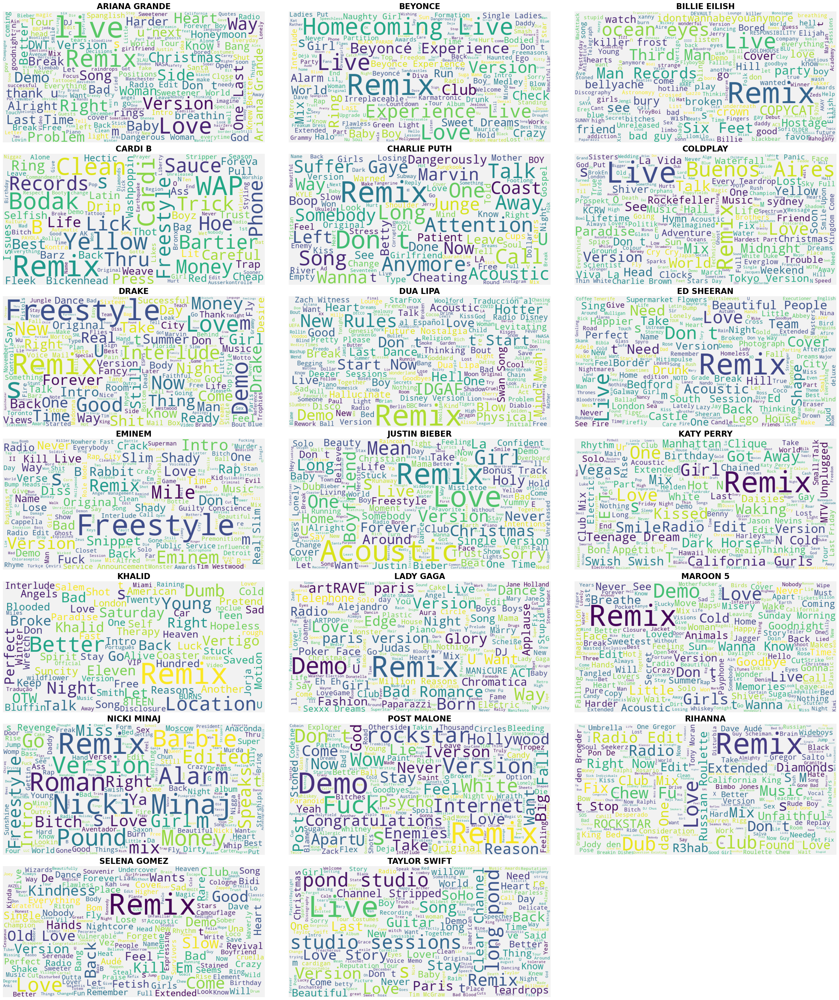

In [227]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Combine all datasets into a list
datasets = [
    (df_ag, 'Ariana Grande'), (df_by, 'Beyonce'), (df_be, 'Billie Eilish'), (df_cb, 'Cardi B'),
    (df_cp, 'Charlie Puth'), (df_cpl, 'ColdPlay'), (df_dr, 'Drake'), (df_dl, 'Dua Lipa'),
    (df_es, 'Ed Sheeran'), (df_em, 'Eminem'), (df_jb, 'Justin Bieber'), (df_kp, 'Katy Perry'),
    (df_kl, 'Khalid'), (df_lg, 'Lady Gaga'), (df_m5, 'Maroon 5'), (df_nm, 'Nicki Minaj'),
    (df_pm, 'Post Malone'), (df_rh, 'Rihanna'), (df_sg, 'Selena Gomez'), (df_ts, 'Taylor Swift')
]

def plot_wordcloud(datasets, row, col):
    wc = WordCloud(background_color="#F2F2F2", max_font_size=90, random_state=42,
                   width=800, height=400)
    fig, axs = plt.subplots(nrows=row, ncols=col, figsize=(30, 35), constrained_layout=True)
    
    for index, (df, artist) in enumerate(datasets):
        text_data = ' '.join(df['Title'].astype(str).tolist())
        wc.generate(text_data)
        
        ax = axs[index // col, index % col]
        ax.imshow(wc, interpolation="bilinear")
        ax.axis("off")
        ax.set_title(artist.upper(), fontsize=20, fontweight='bold')
    
    # Remove any empty subplots
    for j in range(index + 1, row * col):
        fig.delaxes(axs[j // col, j % col])
    
    plt.subplots_adjust(wspace=0.1, hspace=4.5)  # Increase hspace to add more vertical space between rows
    plt.show()

# Plot the word clouds in a 7x3 grid
plot_wordcloud(datasets, 7, 3)

# **Sentiment Analysis**
>**Note** Now we will analyze the sentiment of each song

Analysis is done with a function SentimentIntensityAnalyzer 

In [230]:

#Create lists to store the different scores for each word
def setimentanalyzer(df):
    neg='Negative'
    neu='Neutral'
    pos='Positive'
    negative = []
    neutral = []
    positive = []
    dominant_sentiment=[]
    dominant_sentiment_score=[]
    #Initialize the model
    sid = SentimentIntensityAnalyzer()
    #Iterate for each row of lyrics and append the scores
    for i in df.index:
       
        scores = sid.polarity_scores(df['Lyric'].iloc[i])
        negative.append(scores['neg'])
        neutral.append(scores['neu'])
        positive.append(scores['pos'])
        if scores['neg']>scores['pos']:
            dominant_sentiment_score.append(scores['neg'])
            dominant_sentiment.append(neg)
        elif scores['neg']<scores['pos']:
            dominant_sentiment_score.append(scores['pos'])
            dominant_sentiment.append(pos)
        else:
            dominant_sentiment_score.append(scores['neu'])
            dominant_sentiment.append(neu)
    #Create 5 columns to the main data frame  for each score
    df['negative'] = negative
    df['neutral'] = neutral
    df['positive'] = positive
    df['dominant_sentiment']=dominant_sentiment
    df['dominant_sentiment_score']=dominant_sentiment_score
    return df

In [231]:
df_sentiment=setimentanalyzer(df_main)
df_sentiment.head(5)

,Artist,Title,Album,Date,Lyric,Year,words,Unnamed: 0,negative,neutral,positive,dominant_sentiment,dominant_sentiment_score
0,Ariana Grande,"​thank u, next","thank u, next",2018-11-03,thought i'd end up with sean but he wasn't a m...,2018.0,"[thought, id, end, sean, match, wrote, song, r...",NaN,0.062,0.503,0.435,Positive,0.435
1,Ariana Grande,7 rings,"thank u, next",2019-01-18,yeah breakfast at tiffany's and bottles of bub...,2019.0,"[yeah, breakfast, tiffany, bottle, bubble, gir...",NaN,0.070,0.650,0.280,Positive,0.280
2,Ariana Grande,​God is a woman,Sweetener,2018-07-13,you you love it how i move you you love it how...,2018.0,"[love, move, touch, one, said, done, believe, ...",NaN,0.000,0.733,0.267,Positive,0.267
3,Ariana Grande,Side To Side,Dangerous Woman,2016-05-20,ariana grande nicki minaj i've been here all ...,2016.0,"[ariana, grande, nicki, minaj, ive, night, day...",NaN,0.062,0.865,0.073,Positive,0.073
4,Ariana Grande,​​no tears left to cry,Sweetener,2018-04-20,right now i'm in a state of mind i wanna be in...,2018.0,"[right, im, state, mind, wanna, like, time, ai...",NaN,0.079,0.716,0.204,Positive,0.204


Now based on the above table we do the follwing analyisis where we find out the dominant sentiment of each artist

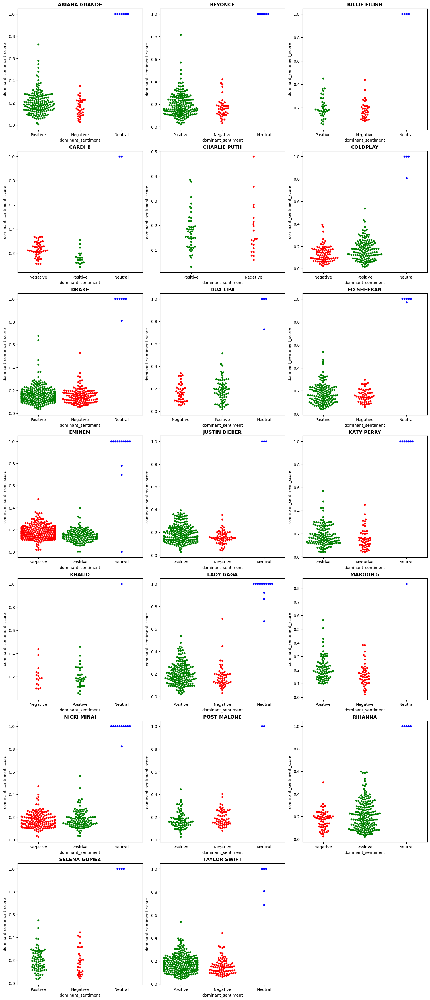

In [234]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_sentiment and df_main are already defined
df_temp = []
artists = df_sentiment['Artist'].unique()

# Create a list of DataFrames for each artist
for artist in artists:
    df_temp.append(df_sentiment[df_sentiment['Artist'] == artist])

# Define the number of rows and columns for the subplots
total_cols = 3
total_rows = 7
fig, axs = plt.subplots(nrows=total_rows, ncols=total_cols,
                        figsize=(5*total_cols, 5*total_rows), constrained_layout=True)

# Flatten the axs array for easier indexing
axs = axs.flatten()

# Define the custom color palette
palette = {'Neutral': 'blue', 'Positive': 'green', 'Negative': 'red'}

# Plot the swarm plots in a grid
for i, artist in enumerate(artists):
    sns.swarmplot(data=df_temp[i], x="dominant_sentiment", y="dominant_sentiment_score", ax=axs[i], palette=palette)
    axs[i].set_title(artist.upper(), fontdict={'fontweight': 'bold'})

# Remove any empty subplots
for j in range(i + 1, total_rows * total_cols):
    fig.delaxes(axs[j])

plt.show()

In [236]:
# Select only numeric columns for mean calculation
numeric_columns = df_sentiment.select_dtypes(include=[np.number]).columns
means_df = df_sentiment.groupby(['Artist'])[numeric_columns].mean()
means_df

,Year,Unnamed: 0,negative,neutral,positive,dominant_sentiment_score
Artist,,,,,,
Ariana Grande,2015.817073,NaN,0.072847,0.750421,0.176683,0.224144
Beyoncé,2009.638037,147.986607,0.076330,0.752429,0.171277,0.213424
Billie Eilish,2018.057692,43.739726,0.118247,0.746260,0.135493,0.236562
Cardi B,2017.433962,37.101449,0.186130,0.698580,0.115275,0.233768
Charlie Puth,2016.224490,35.353846,0.100508,0.755723,0.143846,0.175446
Coldplay,2008.811321,134.013333,0.081262,0.792840,0.125876,0.170591
Drake,2012.016234,220.692857,0.100579,0.761679,0.137748,0.171614
Dua Lipa,2018.023529,79.927928,0.097405,0.755477,0.147117,0.205505
Ed Sheeran,2014.031746,125.336634,0.088698,0.762545,0.148752,0.196921


### Positive Valence:
Positive valence refers to the degree to which an event, object, or situation is perceived as pleasant, desirable, or rewarding. Words or phrases that evoke happiness, joy, love, excitement, or satisfaction typically have positive valence. In sentiment analysis, positive valence scores indicate the presence of positive emotions or sentiments in the text.
<br></br>

### Negative Valence:
Negative valence refers to the degree to which an event, object, or situation is perceived as unpleasant, undesirable, or punishing. Words or phrases that evoke sadness, anger, fear, disgust, or disappointment typically have negative valence. In sentiment analysis, negative valence scores indicate the presence of negative emotions or sentiments in the text.

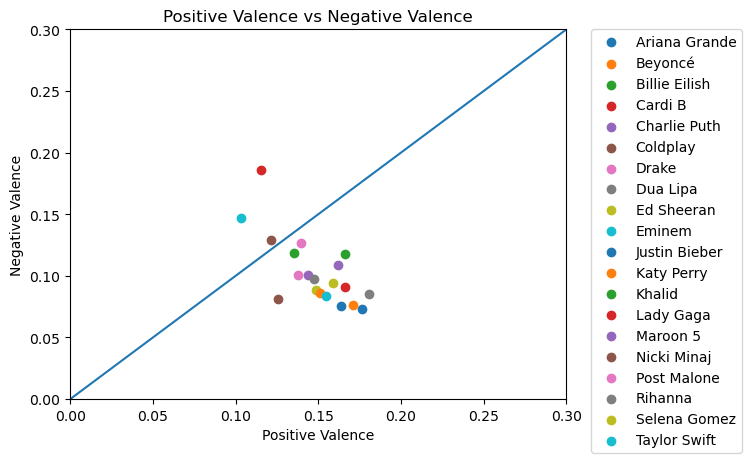

In [238]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming means_df is already defined
x = np.linspace(0, 10, 1000)
for name, group in means_df.groupby('Artist'):
    plt.scatter(group['positive'], group['negative'], label=name)

# Place the legend outside the graph box
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.xlim([0, 0.3])
plt.ylim([0, 0.3])
plt.plot(x, x + 0, linestyle='solid')
plt.title("Positive Valence vs Negative Valence")
plt.xlabel('Positive Valence')
plt.ylabel('Negative Valence')
plt.show()

# **Analysis of Music Valence Distribution Across Artists**

>## **Key Observations**

>### Distribution Patterns
1. Most data points cluster between 0.10-0.20 on the positive valence axis
2. Negative valence values generally range from 0.05-0.15
3. The majority of points fall below the diagonal reference line, indicating a tendency toward more positive than negative emotional content in popular music

>### Artist Positioning
1. Cardi B stands out with one of the highest negative valence scores (approximately 0.19)
2. Most major artists cluster relatively close together, regardless of their genre
3. No artists show extremely high positive valence scores (all remain below 0.20)

>## **Key Conclusions**

>### Industry Standardization
1. A clear "sweet spot" exists in emotional balance that most popular artists target
2. Artists appear to avoid extremes of pure positivity or negativity
3. The clustering suggests an industry standard for emotional content in commercial music

>### Commercial Implications
1. The consistent clustering pattern suggests an optimal emotional mix for commercial success
2. Artists maintain relatively standardized emotional ranges, likely to meet audience expectations
3. This standardization exists across different genres and artist types

>### Creative Strategy
1. Modern popular music appears to follow a formula balancing positive and negative emotions
2. Despite different musical styles and personas, artists maintain similar emotional profiles
3. The data suggests successful artists understand and maintain specific ratios of emotional content

## **Significance**
This visualization reveals interesting patterns about how modern music balances emotional content, suggesting that commercial success in contemporary music might require adherence to certain emotional formulas. The consistency across different artists and genres indicates this might be a fundamental aspect of modern popular music production and composition.